<h3>Installations<h3>

In [1]:
#!pip install pyarrow
#pip install pyarrow --upgrade pip
#!pip install fastparquet
#pip install fastparquet --upgrade pip
#pip install colorama
#pip install umap
#pip install hmmlearn
#pip install ruamel_yaml

<h3>Importations<h3>

In [1]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import vame
import numpy
import ruamel
import os
from pathlib import Path
import scipy.signal
from scipy.stats import iqr
import matplotlib.pyplot as plt
from datetime import datetime as dt
from vame.util.auxiliary import read_config
import torch

C:\Users\Pierr\anaconda3\envs\RL\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


<h3>Fonctions auxiliaires<h3>

In [2]:
def scale(data, standard=['Distance_to_CIPV','LongitudinalAccelCorrected','TransversalAccelCorrected','YawRateCorrected'], minmax=['VehicleSpeed']):
    df=data.copy()
    MinMax_scaler = MinMaxScaler(feature_range=(-1,1))
    Standard_scaler = StandardScaler()
    for col in standard :
        df[col]= Standard_scaler.fit_transform(np.array(df[col]).reshape(-1,1))
    for col in minmax:
        df[col]= MinMax_scaler.fit_transform(np.array(df[col]).reshape(-1,1))
    return df

def scaleOnlyMinMax(data, minmax=['VehicleSpeed','Distance_to_CIPV','LongitudinalAccelCorrected','TransversalAccelCorrected','YawRateCorrected']):
    df=data.copy()
    MinMax_scaler = MinMaxScaler(feature_range=(-3,3))
    for col in data.columns:
        if col in minmax:
            df[col]= MinMax_scaler.fit_transform(np.array(df[col]).reshape(-1,1))
    return df

def open_scale_clean_parquet(num_parquet, columns, scaling=True):
    path="input_full_hdd_"+num_parquet+".parquet"
    a=pd.read_parquet(path)
    data=a[columns]
    data.replace("",np.nan,inplace=True)
    data=data.interpolate(method='nearest', limit=10)#ImputationValeursManquantes
    #data=scale(data) #scaling
    if scaling:
        data = scaleOnlyMinMax(data)
    return data

def compute_deviation_score_speed_deviation_and_length(data,trip): #Return (deviation_score,speed_deviation, length)
    deviation_score=1
    for i in data[data['trip'].isin([trip])].std():
        deviation_score=deviation_score*i
    speed_deviation=data[data['trip'].isin([trip])]['VehicleSpeed'].std()
    length= len(data[data['trip'].isin([trip])])
    return (deviation_score, speed_deviation, length)

def show_parquet_stats(num_parquet,columns): #Columns must include 'trip'  #Helps to pick relevant trips
    path="input_full_hdd_"+num_parquet+".parquet" #Path_
    a=pd.read_parquet(path)
    data=a[columns]
    data.replace("",np.nan,inplace=True)
    data=data.interpolate(method='nearest', limit=10)#ImputationValeursManquantes
    output_columns=['trip','Deviation Score','Speed Deviation', 'length']
    output=pd.DataFrame(columns=output_columns)
    for trip in pd.unique(data['trip']):
        (deviation_score, speed_deviation, length)= compute_deviation_score_speed_deviation_and_length(data, trip)
        df_=pd.DataFrame([[trip, deviation_score, speed_deviation, length]], columns=output_columns)
        output=output.append(df_, ignore_index=True)
        output=output.sort_values(by='Deviation Score',ascending=False)
    return output

def nan_helper(y):
    return np.isnan(y), lambda z: z.nonzero()[0]

def interpol(arr):
    y = np.transpose(arr)
    nans, x = nan_helper(y)
    y[nans]= np.interp(x(nans), x(~nans), y[~nans])
    arr = np.transpose(y)
    return arr

def Create_Trainset_modified(config):
    check_parameter=False
    print(config)
    config_file = Path(config).resolve()
    cfg = read_config(config_file)
    legacy = cfg['legacy']
    fixed = cfg['egocentric_data']

    if not os.path.exists(os.path.join(cfg['project_path'],'data','train',"")):
        os.mkdir(os.path.join(cfg['project_path'],'data','train',""))

    files = []
    if cfg['all_data'] == 'No':
        for file in cfg['video_sets']:
            use_file = input("Do you want to train on " + file + "? yes/no: ")
            if use_file == 'yes':
                files.append(file)
            if use_file == 'no':
                continue
    else:
        for file in cfg['video_sets']:
            files.append(file)


    #traindata_fixed(cfg, files, cfg['test_fraction'], cfg['num_features'], cfg['savgol_filter'], check_parameter)

    if check_parameter == False:
        print("A training and test set has been created. Next step: vame.train_model()")
    savgol_filter=cfg['savgol_filter']
    testfraction=cfg['test_fraction']

    X_train = []
    pos = []
    pos_temp = 0
    pos.append(0)


    file='video-1'
    print("z-scoring of file %s" %file)
    path_to_file = os.path.join(cfg['project_path'],"data", file, file+'-PE-seq.npy')
    data = np.load(path_to_file, allow_pickle=True) #Added : allow_pickle=true
    #X_mean = np.nanmean(data,axis=None)  #Ligne supprimée
    #X_std = np.nanstd(data, axis=None)   #Ligne supprimée
    #X_z = (data.T - X_mean) / X_std      #Ligne supprimée
    X_z=data.T


    #Interpolation réussie
    for i in range(X_z.shape[0]):
        X_z[i,:] = interpol(X_z[i,:])
    X_len = len(data.T)
    pos_temp += X_len
    pos.append(pos_temp)
    X_train=[]
    #X_train.append(X_z) ####Inutile car ici entrainement sur un seul fichier

    X = X_z
    #X_2 = np.concatenate(X_train,axis=0).T   ##Inutile 
    X_med = scipy.signal.savgol_filter(X, cfg['savgol_length'], cfg['savgol_order']) 

    num_frames = len(X_med.T)
    test = int(num_frames*testfraction)

    z_test =X_med[:,:test]
    z_train = X_med[:,test:]

    if check_parameter == True:
        plot_check_parameter(cfg, iqr_val, num_frames, X_true, X_med)


    #save numpy arrays the the test/train info:
    np.save(os.path.join(cfg['project_path'],"data", "train",'train_seq.npy'), z_train)
    np.save(os.path.join(cfg['project_path'],"data", "train", 'test_seq.npy'), z_test)

    for i, file in enumerate(files):
        np.save(os.path.join(cfg['project_path'],"data", file, file+'-PE-seq-clean.npy'), X_med[:,pos[i]:pos[i+1]])

    print('Lenght of train data: %d' %len(z_train.T))
    print('Lenght of test data: %d' %len(z_test.T))

def add_zero_lines(Path): #Adding zero lines to match the training size
    seq=np.load(Path,allow_pickle=True)
    (a,b)=seq.shape
    if a>=12:
        return seq
    else:
        nb_of_zero_lines=12-a
        length=len(seq[0])
        row=np.zeros(length)
        for i in range(nb_of_zero_lines):
            seq=np.concatenate((seq,[row]), axis=0)
    return seq

def Vame_parquet(num_parquet, columns, trips, name=""):    
    working_directory = 'VAMETest'
    if not (name==""):
        project='VAME-'+num_parquet+'-'+name
    else:
        project='VAME-'+num_parquet
    videos = ['VAMETest/video-1.csv']
    
    # Project Initialization
    config = vame.init_new_project(project=project, videos=videos, working_directory=working_directory, videotype='.mp4')
    
    dataOnlyMinMax = open_scale_clean_parquet(num_parquet,columns)
    data1=dataOnlyMinMax[dataOnlyMinMax['trip'].isin(trips)]
    data1=data1.drop("trip",axis=1)
    
    date = dt.today() #Looking for the date
    month = date.strftime("%B")
    day = date.day
    year = date.year
    d = str(month[0:3]+str(day))
    date = dt.today().strftime('%Y-%m-%d')
    project_name = '{pn}-{date}'.format(pn=project, date=d+'-'+str(year))
    chemin_courant = 'VAMETest/VAME-0090_0094-TimeWin10s-Mar19-2023/data'
    # Nom du nouveau dossier
    nom_dossier = "video-1"
    # Chemin complet du nouveau dossier
    chemin_nouveau_dossier = os.path.join(chemin_courant, nom_dossier)
    # Vérifier si le dossier n'existe pas déjà
    if not os.path.exists(chemin_nouveau_dossier):
        os.makedirs(chemin_nouveau_dossier)
        
    np.save(f'VAMETest/'+project_name+'/data/video-1/video-1-PE-seq.npy',data1)
    
    #Trainset creation
    Create_Trainset_modified(config)
    
    #Adding zero lines
    new_test=add_zero_lines('VAMETest/'+project_name+'/data/train/test_seq.npy')
    new_train=add_zero_lines('VAMETest/'+project_name+'/data/train/train_seq.npy')
    seq_clean=np.concatenate((new_test,new_train),axis=1)
    np.save('VAMETest/'+project_name+'/data/train/train_seq.npy',new_train) #Train saved
    np.save('VAMETest/'+project_name+'/data/train/test_seq.npy',new_test) #Test saved
    np.save('VAMETest/'+project_name+'/data/video-1/video-1-PE-seq-clean.npy',seq_clean) #Clean sequence saved, ready to be trained.
    print("")
    print("")
    print("config = '"+config+"'")
    
def get_cluster_echantillon(data_label,config):
    dic_echantillon = {}
    config_file = Path(config).resolve()
    cfg = read_config(config_file)
    length=len(data_label)
    for cluster in range(cfg["n_cluster"]):
        dic_echantillon[cluster]=[]
        k=0
        while k<length and len(dic_echantillon[cluster])<5:
            if data_label[k]==cluster:
                dic_echantillon[cluster].append(k)
                k+=30 #On ne veut pas de chevauchement
            else :
                k+=1
    return dic_echantillon  

def plot_cluster_one_by_one(cluster_echantillon, df, columns_, n_clusters, colors):  
    for key in range (len(cluster_echantillon)):
        value=cluster_echantillon[key]
        print(f"------------------------------------ CLUSTER {key} ---------------------------------------")
        for column in columns_:
            for j in range(0,len(value)):
                temp=df[value[j]:value[j]+30]
                x=np.arange(len(temp))
                plt.plot(x, temp[column],color=colors[column])
            plt.legend([column])
            plt.show()    
            
def plot_cluster(cluster_echantillon, df, columns_, config, colors):
    config_file = Path(config).resolve()
    cfg = read_config(config_file)
    time_window = cfg['time_widow']
    for key in range (len(cluster_echantillon)):
        value=cluster_echantillon[key]
        print(f"------------------------------------ CLUSTER {key} ---------------------------------------")
        total=len(columns_)
        rows=total//2+total%2 #Concerne l'affichage final des graphes (utilisation de la fonction subplot)
        cols=total//2
        fig, ax = plt.subplots(rows, cols)
        i,t=0,-1 #Ligne et colonne d'affichage (utilisation de la fonction subplot)
        for column in columns_:
            if t<cols-1:
                t+=1 #On avance à droite
            else :
                t=0
                i+=1 #On descend d'une ligne
            for j in range(0,len(value)):
                if j==0:
                    label=True
                temp=df[value[j]:value[j]+time_window]
                x=np.arange(len(temp))
                if label :
                    ax[i][t].plot(x, temp[column],color=colors[column],label=column)
                    label= not label
                else:
                    ax[i][t].plot(x, temp[column],color=colors[column])
            #plt.legend([column])

        # set legend position
        fig.legend(bbox_to_anchor=(1.4, 0.65))

        # set spacing to subplots
        fig.tight_layout() 
        plt.show()   


In [3]:
#Inutile de réexecuter
#Fonctions get_cluster_echantillon et plot_cluster comme écrites par PA

def get_cluster_echantillon2(data_label, config):
    cluster_echantillon = []
    cluster_echantillon_temp = []
    dic_echantillon = {}
    config_file = Path(config).resolve()
    cfg = read_config(config_file)
    data_label_copy = data_label.copy()
    skip_index = False

    for i in range(cfg["n_cluster"]):
        score = 0
        nb_echantillon = 0
        for j, k in enumerate(data_label_copy):
            if skip_index:
                if k == i:
                    continue
                else:
                    skip_index = False

            if k == i and nb_echantillon < 10:
                score += 1
                cluster_echantillon_temp.append(j)
            else:
                score = 0 
                cluster_echantillon_temp = []

            if score == 10:
                cluster_echantillon.append(cluster_echantillon_temp)
                cluster_echantillon_temp = []
                nb_echantillon += 1
                skip_index = True

        dic_echantillon[i] = cluster_echantillon
        cluster_echantillon = []
    
    return dic_echantillon

def plot_cluster2(cluster_echantillon, df, column, n_clusters, color='y'):
    for i in range(0,n_clusters):
        print(f"------------------------------------ CLUSTER {i} ---------------------------------------")    
        for key, value in cluster_echantillon.items():
            if key == i:
                for j in range(0,len(value)):
                    temp = df.iloc[value[j]]
                    x=np.arange(len(temp))
                    plt.plot(x, temp[column], color)
        plt.legend([column])
        plt.savefig(f"plot_cluser_{i}.png")
        plt.show()

<h3>Choix des trip au sein d'un parquet<h3>

In [3]:
# Warning : Columns must include 'trip'
columns=["Distance_to_CIPV","LongitudinalAccelCorrected","TransversalAccelCorrected","VehicleSpeed","trip"]
#num_parquet='0095_0099'
num_parquet='0090_0094'

In [11]:
stats=show_parquet_stats(num_parquet,columns)

C:\Users\Pierr\anaconda3\envs\VAME\lib\site-packages\pandas\core\frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
C:\Users\Pierr\anaconda3\envs\VAME\lib\site-packages\ipykernel_launcher.py:32: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


In [12]:
stats

,trip,Deviation Score,Speed Deviation,length
0,CERTIF_HHN_1995_AEB_20211125_152041,6.265036,46.482338,901
1,CERTIF_HHN_1995_AEB_20211123_171454,5.904063,36.543640,10595
2,CERTIF_HHN_1995_AEB_20211123_140758,3.476712,26.276659,55861
3,CERTIF_HHN_1995_AEB_20211123_124532,3.059144,20.756132,34529
4,CERTIF_HHN_1995_AEB_20211123_111016,2.787956,30.345257,21620
...,...,...,...,...
124,CERTIF_HHN_1995_AEB_20211126_115545,0.000000,7.322230,3604
125,CERTIF_HHN_1995_AEB_20211126_134946,0.000000,20.412251,11167
126,CERTIF_HHN_1995_AEB_20211126_143640,0.000000,8.296988,900
127,CERTIF_HHN_1995_AEB_20211127_123526,0.000000,4.868985,99


In [4]:
#Trips choice
#trips=['CERTIF_HHN_1995_AEB_20211123_171454', 'CERTIF_HHN_1995_AEB_20211123_140758', 'CERTIF_HHN_1995_AEB_20211123_124532']
#trips=['CERTIF_HHN_1995_AEB_20211120_115232','CERTIF_HHN_1995_AEB_20211120_100111']
#trips = ['CERTIF_HHN_1949_AEB_20211106_102306', 'CERTIF_HHN_1949_AEB_20211106_071358']
trips=['CERTIF_HHN_1995_AEB_20211120_115232','CERTIF_HHN_1995_AEB_20211120_100111']

<h4>Initialisation Projet<h4>

In [4]:
#Initializing the project, You only have to run this cell once, when creating the project
Vame_parquet(num_parquet, columns, trips,name="TimeWin10s")

NameError: name 'trips' is not defined

In [5]:
#Copy the string above (config definition) and paste it below


#config = '/home/epic_euclid/workdir/Projet_Infonum/projet-infonum-renault/VAME/VAME/VAME/VAME/VAME-0095_0099-Feb8-2023/config.yaml'
#config = '/home/epic_euclid/workdir/Projet_Infonum/projet-infonum-renault/VAME/VAME/VAME/VAME/VAME-0090_0094-7Clusters-1s-Feb27-2023/config.yaml'

config = 'VAMETest\VAME-0090_0094-TimeWin10s-Mar19-2023\config.yaml'
#You can now train the model, go to config.yaml to choose the model parameters (e.g kmeans cluters number)

In [7]:
#1135
data_ = open_scale_clean_parquet(num_parquet,columns, scaling=False)
df=data_[data_['trip'].isin(trips)]
df=df.drop("trip",axis=1)

C:\Users\Pierr\AppData\Local\Temp\ipykernel_7300\4051960654.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.replace("",np.nan,inplace=True)


double ok


C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\vame\analysis\tree_hierarchy.py:67: RuntimeWarning: divide by zero encountered in double_scalars
  cost = (motif_norm[i] + motif_norm[j]) / np.abs(transition_matrix[i,j] + transition_matrix[j,i] )
C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\vame\analysis\tree_hierarchy.py:67: RuntimeWarning: invalid value encountered in double_scalars
  cost = (motif_norm[i] + motif_norm[j]) / np.abs(transition_matrix[i,j] + transition_matrix[j,i] )
100%|██████████| 2002/2002 [53:33<00:00,  1.60s/it]


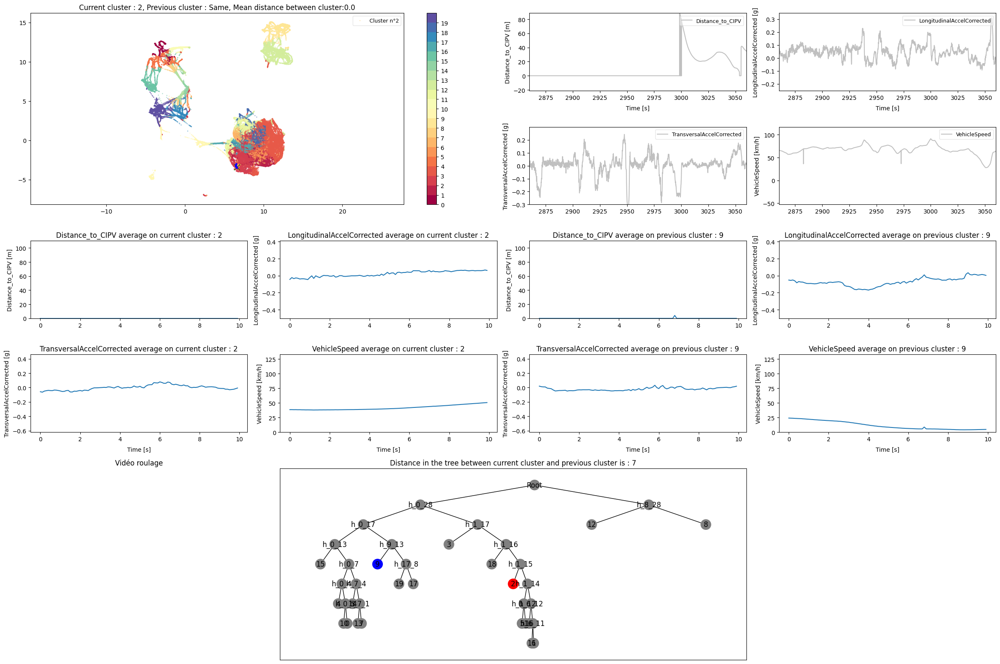

In [7]:
vame.gif(config, df, pose_ref_index=[0,5], subtract_background=True, start=8590, length=2002, max_lag=30, 
            label='motif', file_format='.mp4', crop_size=(300,300))

In [3]:
vame.motif_videos(config)

double ok
Cluster size is: 20 
['video-1gif_8590.png', 'video-1gif_8591.png', 'video-1gif_8592.png', 'video-1gif_8593.png', 'video-1gif_8594.png', 'video-1gif_8595.png', 'video-1gif_8596.png', 'video-1gif_8597.png', 'video-1gif_8598.png', 'video-1gif_8599.png', 'video-1gif_8600.png', 'video-1gif_8601.png', 'video-1gif_8602.png', 'video-1gif_8603.png', 'video-1gif_8604.png', 'video-1gif_8605.png', 'video-1gif_8606.png', 'video-1gif_8607.png', 'video-1gif_8608.png', 'video-1gif_8609.png', 'video-1gif_8610.png', 'video-1gif_8611.png', 'video-1gif_8612.png', 'video-1gif_8613.png', 'video-1gif_8614.png', 'video-1gif_8615.png', 'video-1gif_8616.png', 'video-1gif_8617.png', 'video-1gif_8618.png', 'video-1gif_8619.png', 'video-1gif_8620.png', 'video-1gif_8621.png', 'video-1gif_8622.png', 'video-1gif_8623.png', 'video-1gif_8624.png', 'video-1gif_8625.png', 'video-1gif_8626.png', 'video-1gif_8627.png', 'video-1gif_8628.png', 'video-1gif_8629.png', 'video-1gif_8630.png', 'video-1gif_8631.png', 'v

100%|██████████| 2002/2002 [01:51<00:00, 17.89it/s]

All videos have been created!


<h4>Entraînement du modèle<h4>

In [8]:
# Step 2:
# Train VAME:
vame.train_model(config)

double ok
Train Variational Autoencoder - model name: VAME 

Using CUDA
GPU active: True
GPU used:  NVIDIA GeForce RTX 2060
Latent Dimensions: 30, Time window: 100, Batch Size: 256, Beta: 1, lr: 0.0005

Compute mean and std for temporal dataset.
Initialize train data. Datapoints 67905
Initialize test data. Datapoints 7545
Scheduler step size: 100, Scheduler gamma: 0.20

Start training... 
Epoch: 1
Train loss: 37149.332, MSE-Loss: 32063.179, MSE-Future-Loss 5086.153, KL-Loss: 0.000, Kmeans-Loss: 0.000, weight: 0.00
Test loss: 4636.992, MSE-Loss: 4636.992, KL-Loss: 0.000, Kmeans-Loss: 0.000


Epoch: 2
Train loss: 13408.954, MSE-Loss: 11435.959, MSE-Future-Loss 1972.995, KL-Loss: 0.000, Kmeans-Loss: 0.000, weight: 0.00
Test loss: 2376.675, MSE-Loss: 2376.675, KL-Loss: 0.000, Kmeans-Loss: 0.000


Epoch: 3
Train loss: 8281.043, MSE-Loss: 6649.155, MSE-Future-Loss 1629.713, KL-Loss: 1.634, Kmeans-Loss: 0.541, weight: 0.25
Test loss: 1498.457, MSE-Loss: 1496.180, KL-Loss: 1.764, Kmeans-Loss: 

Test loss: 437.487, MSE-Loss: 427.819, KL-Loss: 7.209, Kmeans-Loss: 2.459


Epoch: 39
Train loss: 1868.943, MSE-Loss: 1287.348, MSE-Future-Loss 571.994, KL-Loss: 6.773, Kmeans-Loss: 2.828, weight: 1.00
Test loss: 427.907, MSE-Loss: 418.200, KL-Loss: 7.210, Kmeans-Loss: 2.497


Epoch: 40
Train loss: 1856.233, MSE-Loss: 1298.169, MSE-Future-Loss 548.463, KL-Loss: 6.766, Kmeans-Loss: 2.835, weight: 1.00
Test loss: 357.887, MSE-Loss: 348.175, KL-Loss: 7.235, Kmeans-Loss: 2.477
Saving model!


Epoch: 41
Train loss: 1787.812, MSE-Loss: 1258.055, MSE-Future-Loss 520.145, KL-Loss: 6.769, Kmeans-Loss: 2.844, weight: 1.00
Test loss: 490.310, MSE-Loss: 480.644, KL-Loss: 7.173, Kmeans-Loss: 2.492


Epoch: 42
Train loss: 1798.521, MSE-Loss: 1265.778, MSE-Future-Loss 523.150, KL-Loss: 6.748, Kmeans-Loss: 2.845, weight: 1.00
Test loss: 380.124, MSE-Loss: 370.462, KL-Loss: 7.171, Kmeans-Loss: 2.491


Epoch: 43
Train loss: 1739.154, MSE-Loss: 1222.024, MSE-Future-Loss 507.544, KL-Loss: 6.736, Kmeans-Lo

Train loss: 1304.131, MSE-Loss: 987.172, MSE-Future-Loss 307.448, KL-Loss: 6.554, Kmeans-Loss: 2.957, weight: 1.00
Test loss: 358.508, MSE-Loss: 348.987, KL-Loss: 6.951, Kmeans-Loss: 2.570


Epoch: 80
Train loss: 1234.828, MSE-Loss: 933.751, MSE-Future-Loss 291.566, KL-Loss: 6.547, Kmeans-Loss: 2.964, weight: 1.00
Test loss: 369.493, MSE-Loss: 360.024, KL-Loss: 6.944, Kmeans-Loss: 2.525


Epoch: 81
Train loss: 1205.835, MSE-Loss: 927.314, MSE-Future-Loss 269.008, KL-Loss: 6.553, Kmeans-Loss: 2.961, weight: 1.00
Test loss: 355.159, MSE-Loss: 345.713, KL-Loss: 6.928, Kmeans-Loss: 2.517


Epoch: 82
Train loss: 1227.560, MSE-Loss: 931.027, MSE-Future-Loss 287.020, KL-Loss: 6.549, Kmeans-Loss: 2.964, weight: 1.00
Test loss: 370.203, MSE-Loss: 360.719, KL-Loss: 6.925, Kmeans-Loss: 2.559


Epoch: 83
Train loss: 1207.874, MSE-Loss: 920.834, MSE-Future-Loss 277.530, KL-Loss: 6.540, Kmeans-Loss: 2.969, weight: 1.00
Test loss: 354.015, MSE-Loss: 344.570, KL-Loss: 6.919, Kmeans-Loss: 2.526


Epoch

Test loss: 321.904, MSE-Loss: 312.718, KL-Loss: 6.643, Kmeans-Loss: 2.543


Epoch: 120
Train loss: 988.153, MSE-Loss: 789.171, MSE-Future-Loss 189.628, KL-Loss: 6.359, Kmeans-Loss: 2.994, weight: 1.00
Test loss: 327.684, MSE-Loss: 318.490, KL-Loss: 6.660, Kmeans-Loss: 2.534


Epoch: 121
Train loss: 982.399, MSE-Loss: 781.227, MSE-Future-Loss 191.821, KL-Loss: 6.360, Kmeans-Loss: 2.992, weight: 1.00
Test loss: 327.333, MSE-Loss: 318.150, KL-Loss: 6.654, Kmeans-Loss: 2.529


Epoch: 122
Train loss: 1002.237, MSE-Loss: 768.094, MSE-Future-Loss 224.795, KL-Loss: 6.350, Kmeans-Loss: 2.998, weight: 1.00
Test loss: 349.656, MSE-Loss: 340.454, KL-Loss: 6.635, Kmeans-Loss: 2.567


Epoch: 123
Train loss: 958.441, MSE-Loss: 755.833, MSE-Future-Loss 193.260, KL-Loss: 6.355, Kmeans-Loss: 2.993, weight: 1.00
Test loss: 343.976, MSE-Loss: 334.785, KL-Loss: 6.641, Kmeans-Loss: 2.549


Epoch: 124
Train loss: 954.155, MSE-Loss: 754.467, MSE-Future-Loss 190.332, KL-Loss: 6.354, Kmeans-Loss: 3.002, weight:

<h4>Evaluation du modèle<h4>

double ok
Using CUDA
GPU active: True
GPU used: NVIDIA GeForce RTX 2060


Evaluation of VAME model. 

Initialize test data. Datapoints 7545
train loss : [37149.33228279 13408.95368541  8281.04348662  6579.07757568
  5513.03078669  4895.76247059  4433.80892297  4199.3745931
  3940.01464751  3766.59654929  3596.31843706  3507.06612142
  3323.87434341  3240.7173018   3127.56867565  3085.77946703
  2991.60695348  2954.83890372  2796.54443452  2720.64687925
  2742.55367672  2561.1686443   2522.01258896  2545.39452755
  2349.53824269  2335.17209417  2330.25899482  2285.41060893
  2192.87043531  2206.68709449  2114.98258186  2149.41847599
  2067.00473022  2029.63339742  2023.2892567   1954.54662485
  1930.02981706  1897.63561179  1868.94312818  1856.23281768
  1787.81242001  1798.52084767  1739.15428532  1744.7601064
  1744.44697894  1734.02372464  1727.84329224  1655.90401112
  1679.34123739  1622.07166452  1618.02071404  1591.08053404
  1579.97342011  1553.53082853  1524.87756255  1582.7242

You can find the results of the evaluation in '/Your-VAME-Project-Apr30-2020/model/evaluate/' 
OPTIONS:
- vame.behavior_segmentation() to identify behavioral motifs.
- re-run the model for further fine tuning. Check again with vame.evaluate_model()


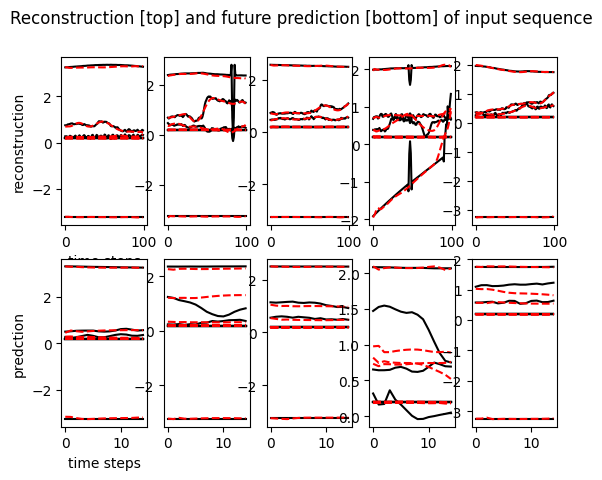

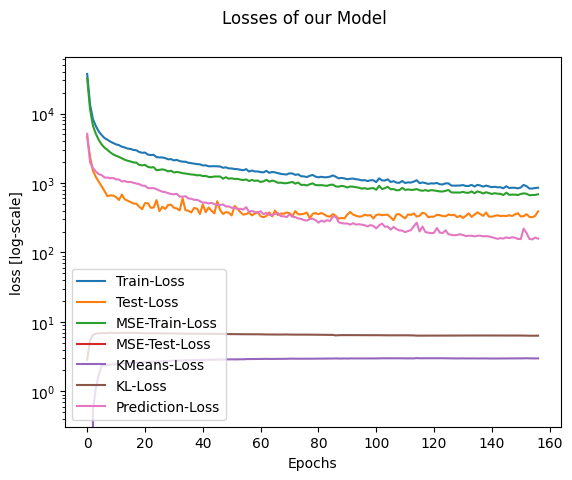

In [3]:
# Step 3:
# Evaluate model
vame.evaluate_model(config)

<h4>Identification des clusters<h4>

In [14]:
# Step 4:
# Segment motifs/pose
vame.pose_segmentation(config)

double ok
Pose segmentation for VAME model: VAME 

yes
Using CUDA
GPU active: True
GPU used: NVIDIA GeForce RTX 2060
Embedding of latent vector for file video-1


100%|██████████| 75350/75350 [14:48<00:00, 84.80it/s] 


For all animals the same parameterization of latent vectors is applied for 20 cluster
Using kmeans as parameterization!
C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0090_0094-TimeWin10s-Mar19-2023\results\video-1\VAME\kmeans-20\
You succesfully extracted motifs with VAME! From here, you can proceed running vame.motif_videos() 


double ok


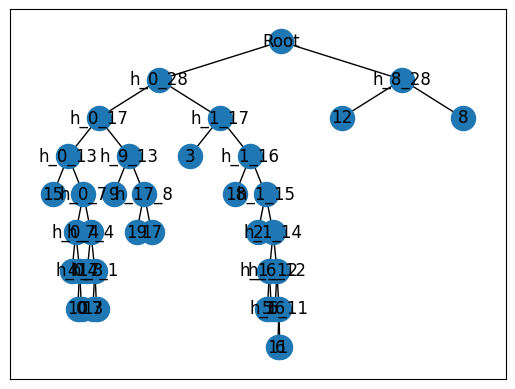

In [11]:
# OPTIONAL: Create behavioural hierarchies via community detection
vame.community(config, show_umap=False, cut_tree=3)

<h4>Affichage des profils de clusters<h4>

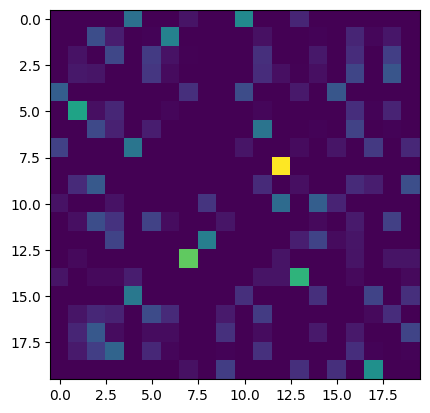

In [12]:
Path_transition_matrix='VAMETest/VAME-0090_0094-TimeWin10s-Mar19-2023/results/video-1/VAME/kmeans-20/community/transition_matrix_video-1.npy'

Transition_matrix=np.load(Path_transition_matrix)
plt.imshow(Transition_matrix)

In [6]:
vame.visualization(config, label='motif')

double ok
Visualizing 75350 data points.. 


In [13]:
com_label='VAMETest/VAME-0090_0094-TimeWin10s-Mar19-2023/results/video-1/VAME/kmeans-20/community/community_label_video-1.npy'
com_label_l = np.load(com_label)
np.unique(com_label_l)

array([0, 1, 2], dtype=int64)

In [3]:
vame.community_videos(config)

double ok
Cluster size is: 20 
Community videos getting created for video-1 ...


100%|██████████| 50/50 [00:02<00:00, 20.61it/s]

All videos have been created!


In [13]:
#CERTIF_HHN_1995_AEB_20211120_100111, time_window de 5268300 à 5468100 (de 87 à 91 min), num_parquet='0090_0094'
df.iloc[8590:10590]

,Distance_to_CIPV,LongitudinalAccelCorrected,TransversalAccelCorrected,VehicleSpeed,trip
5268300,0.0,-0.058,-0.086,96.629997,CERTIF_HHN_1995_AEB_20211120_100111
5268400,0.0,-0.041,-0.079,96.540001,CERTIF_HHN_1995_AEB_20211120_100111
5268500,0.0,-0.028,-0.081,96.500000,CERTIF_HHN_1995_AEB_20211120_100111
5268600,0.0,-0.014,-0.073,96.220001,CERTIF_HHN_1995_AEB_20211120_100111
5268700,0.0,-0.031,-0.073,96.070000,CERTIF_HHN_1995_AEB_20211120_100111
...,...,...,...,...,...
5467700,0.0,-0.035,0.277,24.049999,CERTIF_HHN_1995_AEB_20211120_100111
5467800,0.0,-0.035,0.235,24.070000,CERTIF_HHN_1995_AEB_20211120_100111
5467900,0.0,0.027,0.312,23.980000,CERTIF_HHN_1995_AEB_20211120_100111
5468000,0.0,-0.028,0.283,24.070000,CERTIF_HHN_1995_AEB_20211120_100111


In [252]:
# Compter le nombre d'observations dans chaque cluster
def cluster_utilisation(data_label):
    counts = pd.Series(data_label).value_counts()
    print(type(counts))
    percentages = counts / len(data_label) * 100
    return percentages

In [51]:
cluster_echantillon = get_cluster_echantillon(data_label, config)

C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0005_0009-100Clusters-1s-Feb28-2023\config.yaml
ok


In [52]:
#Choose the column to plot
#columns=["Distance_to_CIPV","LongitudinalAccelCorrected","TransversalAccelCorrected","VehicleSpeed","YawRateCorrected","trip"]
colors={}
columns_=["Distance_to_CIPV","LongitudinalAccelCorrected","TransversalAccelCorrected","VehicleSpeed"]
colors["Distance_to_CIPV"]="r"
colors["LongitudinalAccelCorrected"]="b"
colors["TransversalAccelCorrected"]="y"
colors["VehicleSpeed"]="g"

------------------------------------ CLUSTER 0 ---------------------------------------


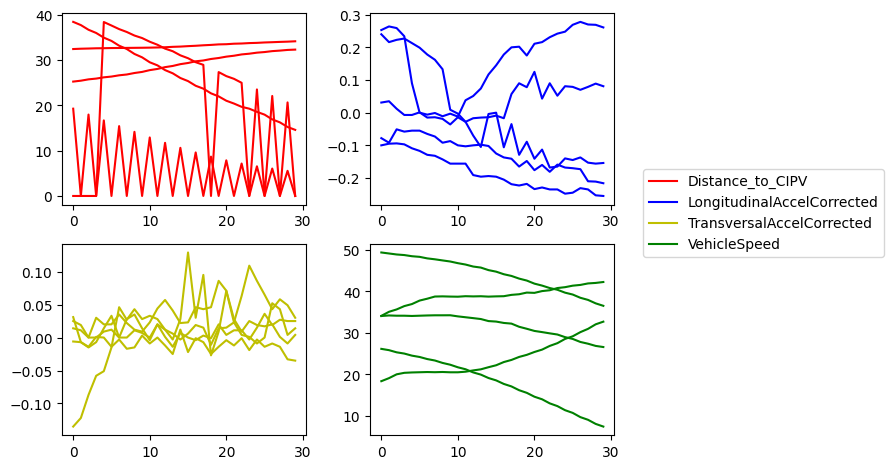

------------------------------------ CLUSTER 1 ---------------------------------------


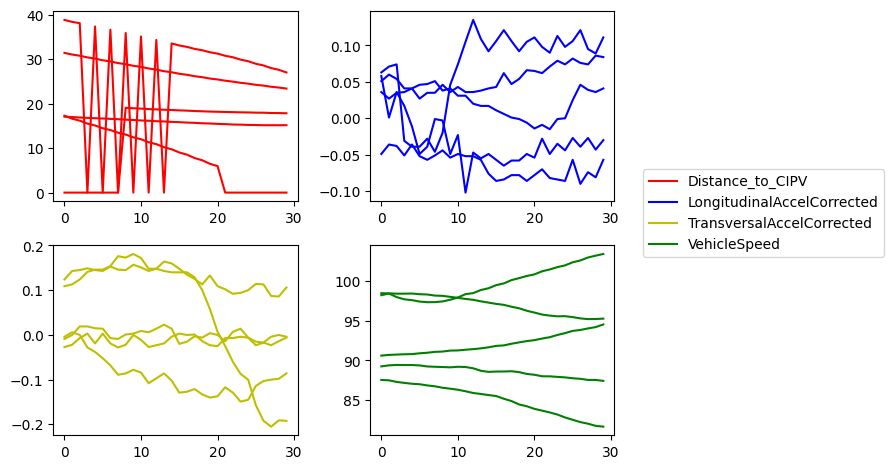

------------------------------------ CLUSTER 2 ---------------------------------------


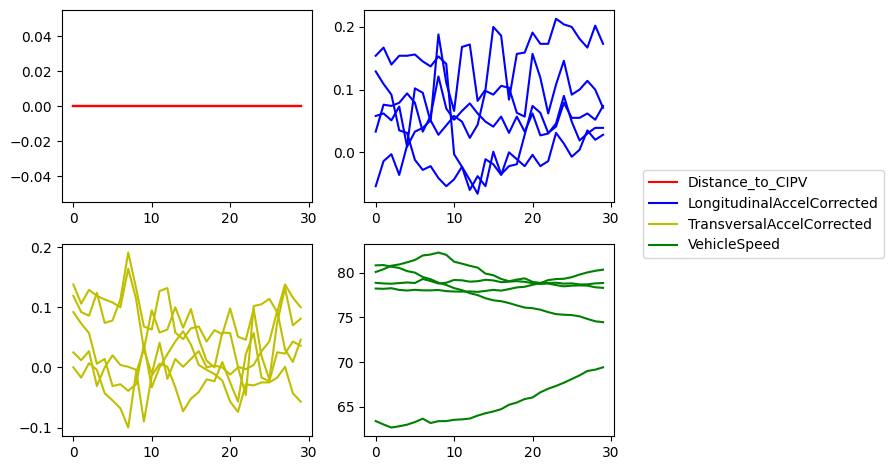

------------------------------------ CLUSTER 3 ---------------------------------------


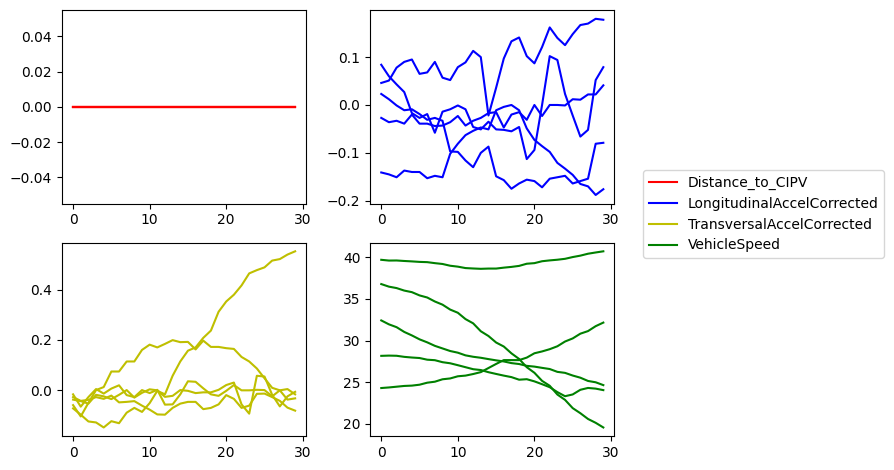

------------------------------------ CLUSTER 4 ---------------------------------------


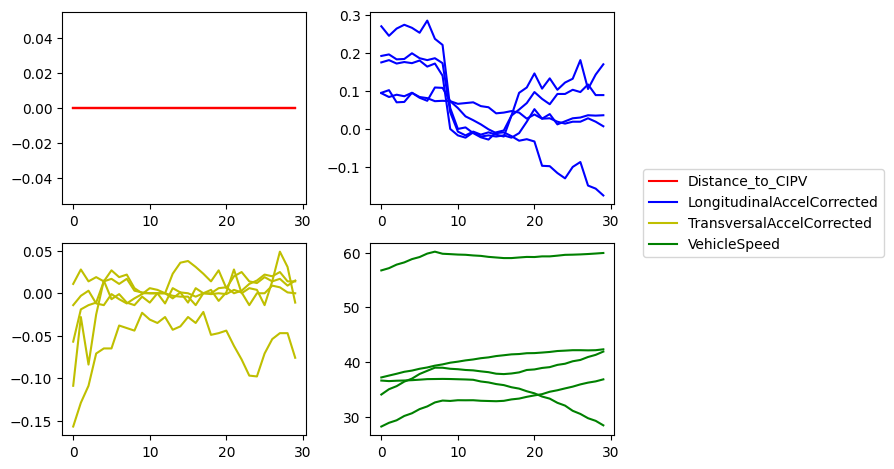

------------------------------------ CLUSTER 5 ---------------------------------------


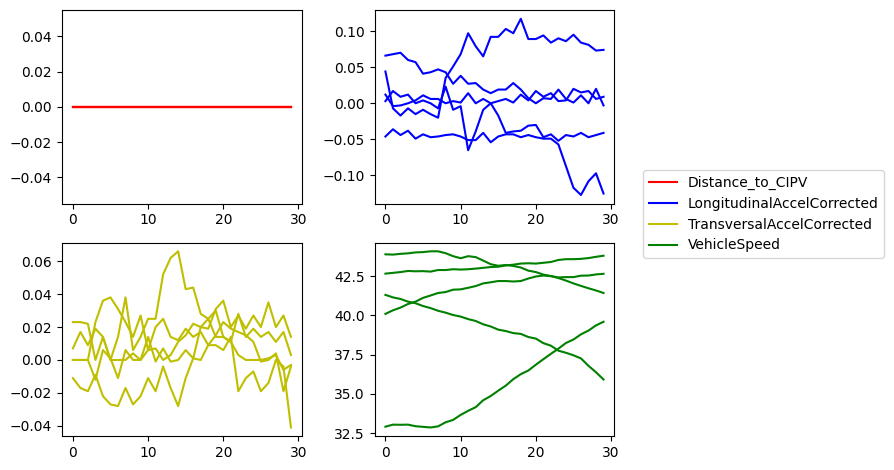

------------------------------------ CLUSTER 6 ---------------------------------------


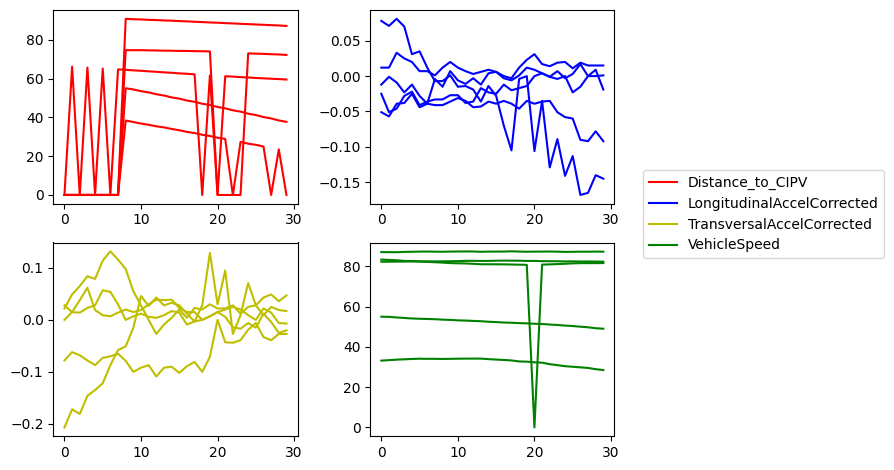

------------------------------------ CLUSTER 7 ---------------------------------------


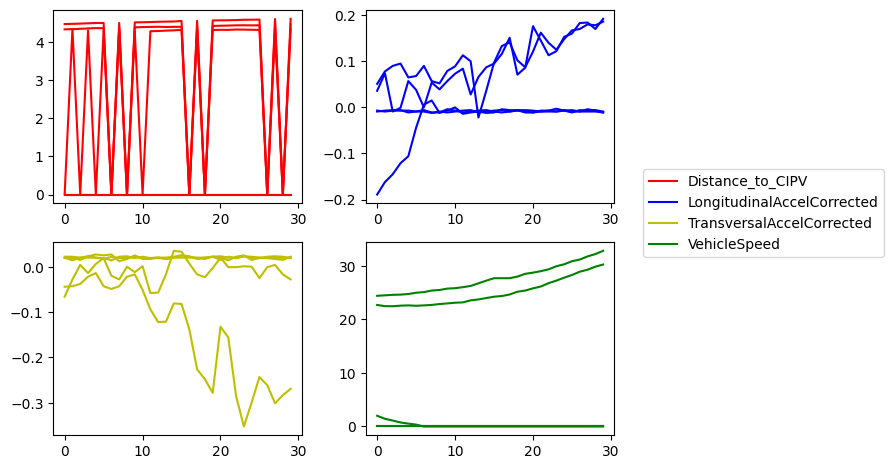

------------------------------------ CLUSTER 8 ---------------------------------------


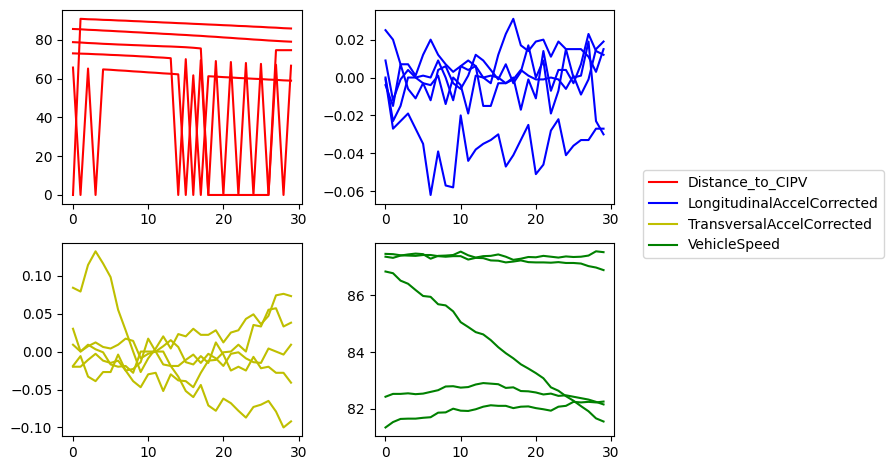

------------------------------------ CLUSTER 9 ---------------------------------------


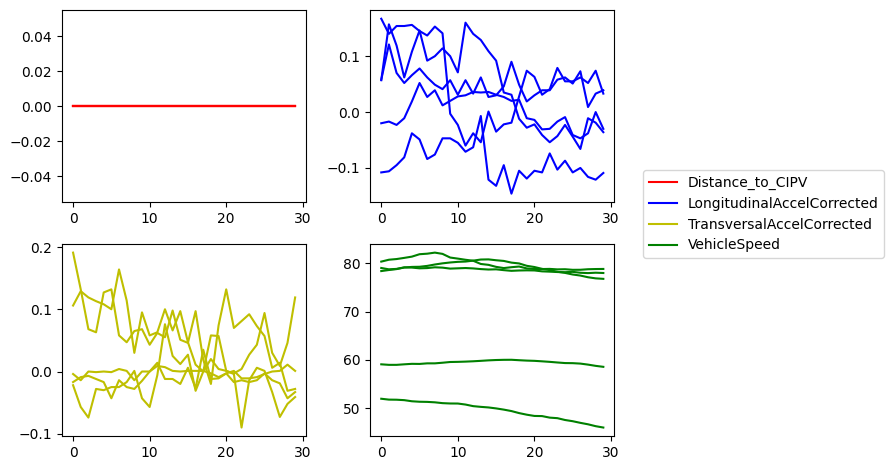

------------------------------------ CLUSTER 10 ---------------------------------------


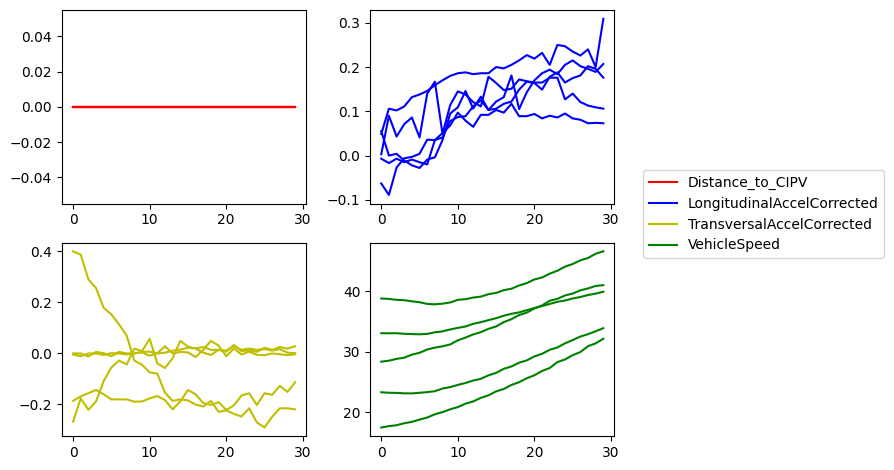

------------------------------------ CLUSTER 11 ---------------------------------------


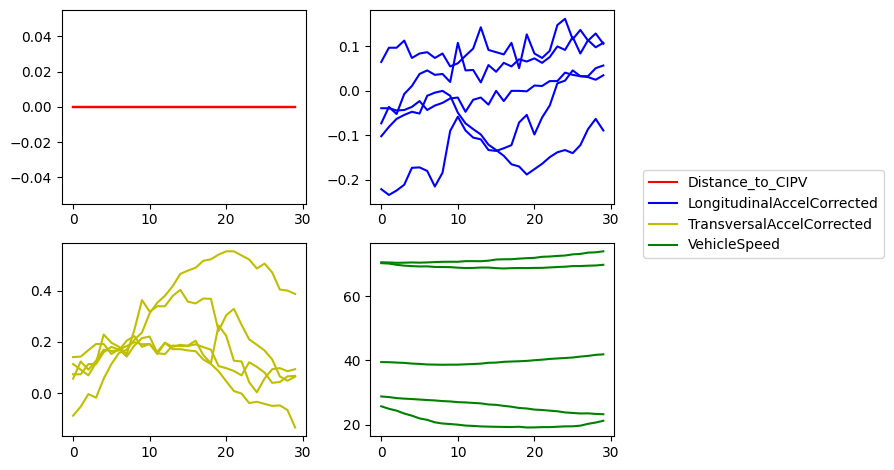

------------------------------------ CLUSTER 12 ---------------------------------------


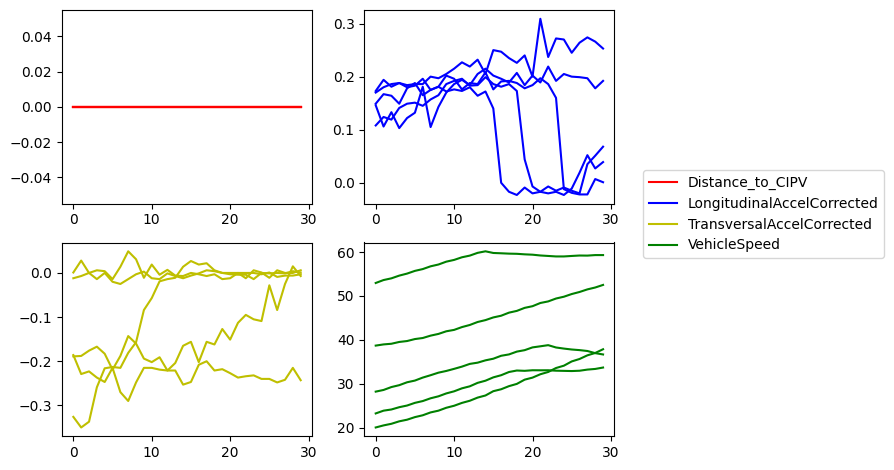

------------------------------------ CLUSTER 13 ---------------------------------------


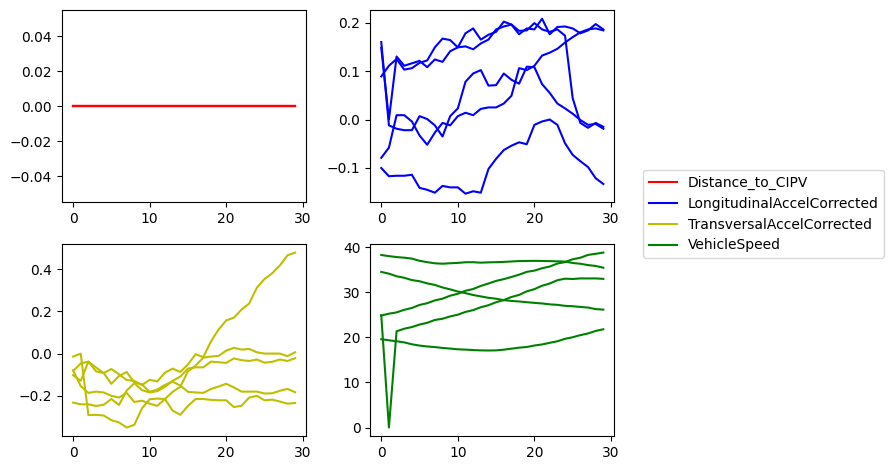

------------------------------------ CLUSTER 14 ---------------------------------------


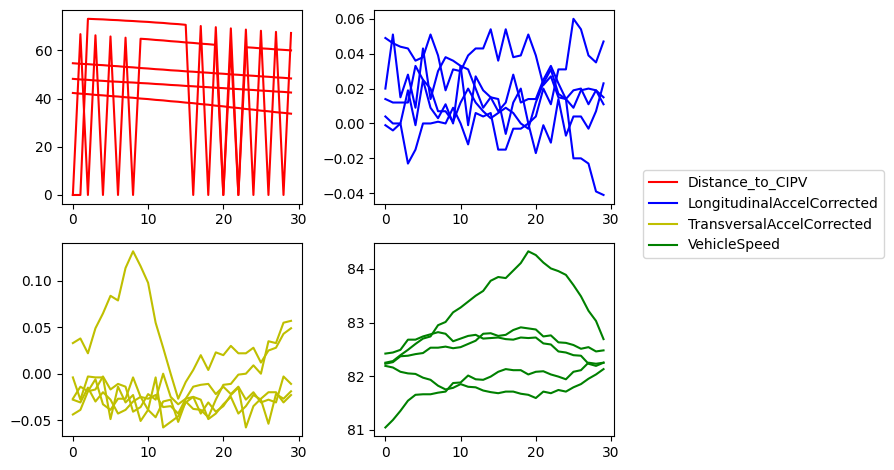

------------------------------------ CLUSTER 15 ---------------------------------------


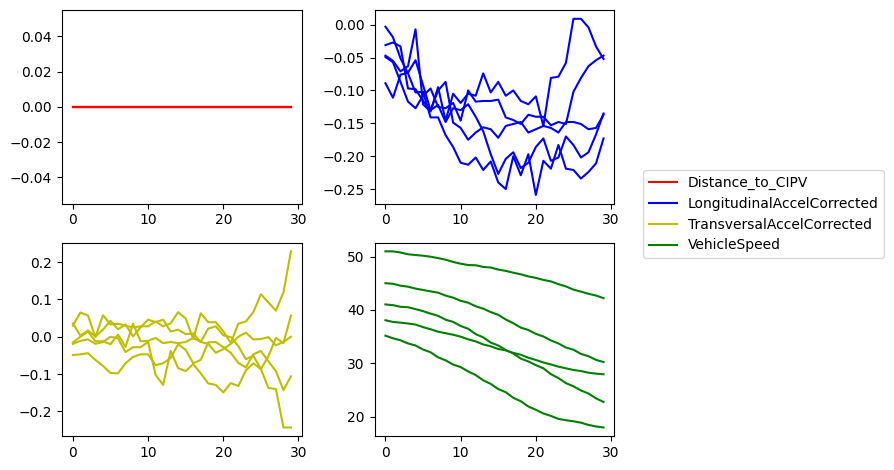

------------------------------------ CLUSTER 16 ---------------------------------------


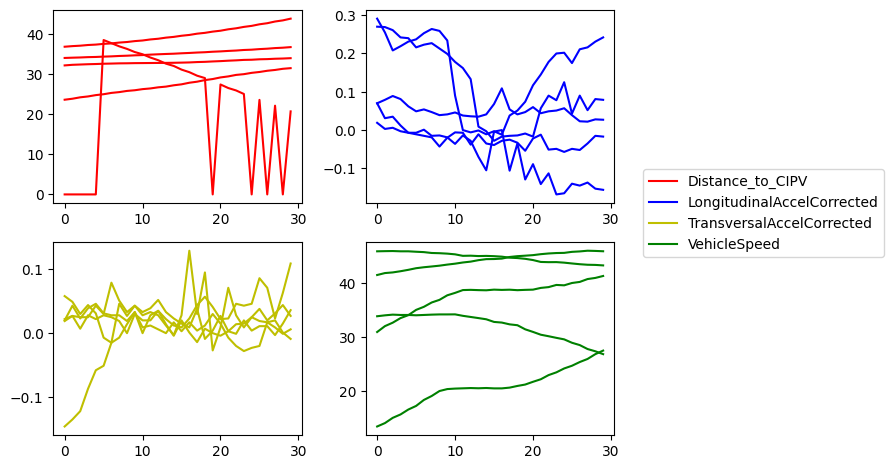

------------------------------------ CLUSTER 17 ---------------------------------------


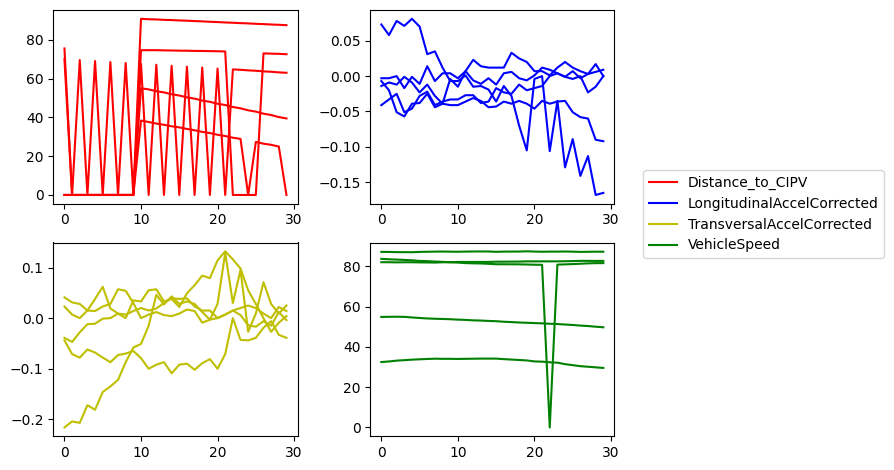

------------------------------------ CLUSTER 18 ---------------------------------------


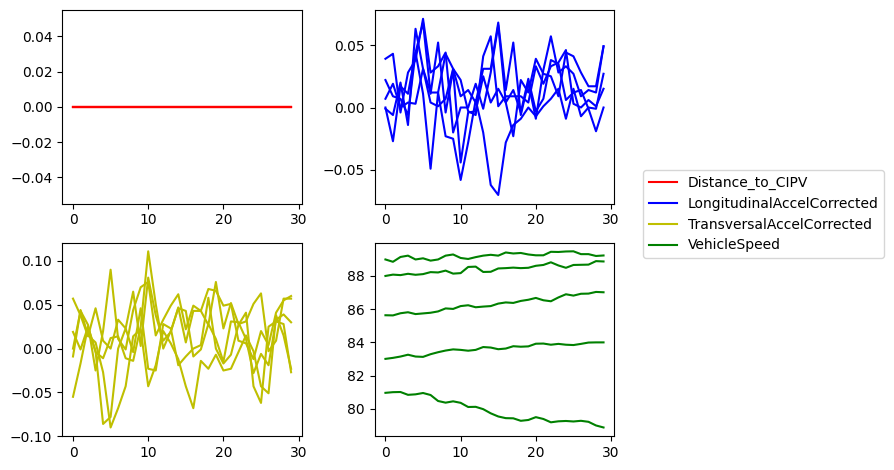

------------------------------------ CLUSTER 19 ---------------------------------------


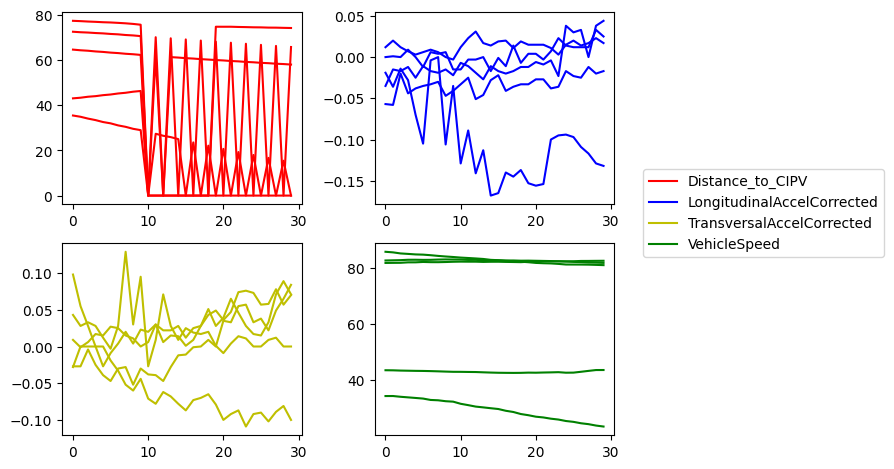

In [53]:
plot_cluster(cluster_echantillon,df,columns_,config, colors)

In [86]:
dataOnlyMinMax = open_scale_clean_parquet(num_parquet,columns)
data1=dataOnlyMinMax[dataOnlyMinMax['trip'].isin(trips)]
data1=data1.drop("trip",axis=1)

C:\Users\Pierr\anaconda3\envs\VAME\lib\site-packages\pandas\core\frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,


In [226]:
def extract_time_windows(df, config):
    config_file = Path(config).resolve()
    cfg = read_config(config_file)
    time_window = cfg['time_window'] # Nombre de lignes par paquet
    m = time_window-1  # Nombre de lignes en commun avec le paquet précédent
    start = 0  # Indice de début pour le premier paquet
    end = start + time_window  # Indice de fin pour le premier paquet
    prev_end = start  # Indice de fin  pour le paquet précédent
    current = []
    # Boucle pour diviser les lignes en paquets
    while end <= len(df):
        # Extraire les lignes du paquet actuel
        current.append(np.ravel(df.iloc[start:end].values))
        # Mettre à jour les variables pour le prochain paquet
        prev_end = start + time_window - m
        start += time_window - m
        end += time_window - m
    return current

In [255]:
extract = extract_time_windows(data1.iloc[:50000], config)

C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0005_0009-100Clusters-1s-Feb28-2023\config.yaml
ok


In [23]:
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
#verif avec timewidow de 10s
#echantillon espace latent
#metrics pour la différentation des patterns (comparaison des times series)
def silhouette_score_calculus(config):
    list_cluster = [20]
    config_file = Path(config).resolve()
    cfg = read_config(config_file)
    data_ = open_scale_clean_parquet(num_parquet,columns, scaling=False)
    df=data_[data_['trip'].isin(trips)]
    df=df.drop("trip",axis=1)
    silhouette_avg_agg = []
    for n_clusters in list_cluster:
        modify_yaml(config, 'n_cluster', n_clusters)
        vame.pose_segmentation(config)

        Path_label=f'VAMETest/VAME-0090_0094-TimeWin10s-Mar19-2023/results/video-1/VAME/kmeans-{n_clusters}/{n_clusters}_km_label_video-1.npy'
        data_label=np.load(Path_label)
        
        silhouette_avg = silhouette_score(df[:len(data_label)], data_label)
        silhouette_avg_agg.append(silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(df[:100935], data_label)
        
        vame.visualization_for_silhouette(config, 'motif', len(df), n_clusters, sample_silhouette_values, silhouette_avg)
    return silhouette_avg_agg

In [21]:
import yaml
def modify_yaml(config, parameter_name, new_value):
    config_file = Path(config).resolve()
    cfg = read_config(config_file)
    with open(config, 'r') as f:
        data = yaml.safe_load(f)

    data[parameter_name] = new_value
    
    # Save changes to YAML file
    with open(config, 'w') as f:
        yaml.dump(data, f)


ok path exists
ok path exists
Pose segmentation for VAME model: VAME 

yes
Using CUDA
GPU active: True
GPU used: NVIDIA GeForce RTX 2060
Embedding of latent vector for file video-1


100%|██████████| 100935/100935 [11:31<00:00, 145.99it/s]


For all animals the same parameterization of latent vectors is applied for 5 cluster
Using kmeans as parameterization!
C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0095_0099-TimeWin5s-Mar14-2023\results\video-1\VAME\kmeans-5\
You succesfully extracted motifs with VAME! From here, you can proceed running vame.motif_videos() 
ok path exists
Compute embedding for file video-1
Embedding 30000 data points..
Visualizing 30000 data points.. 


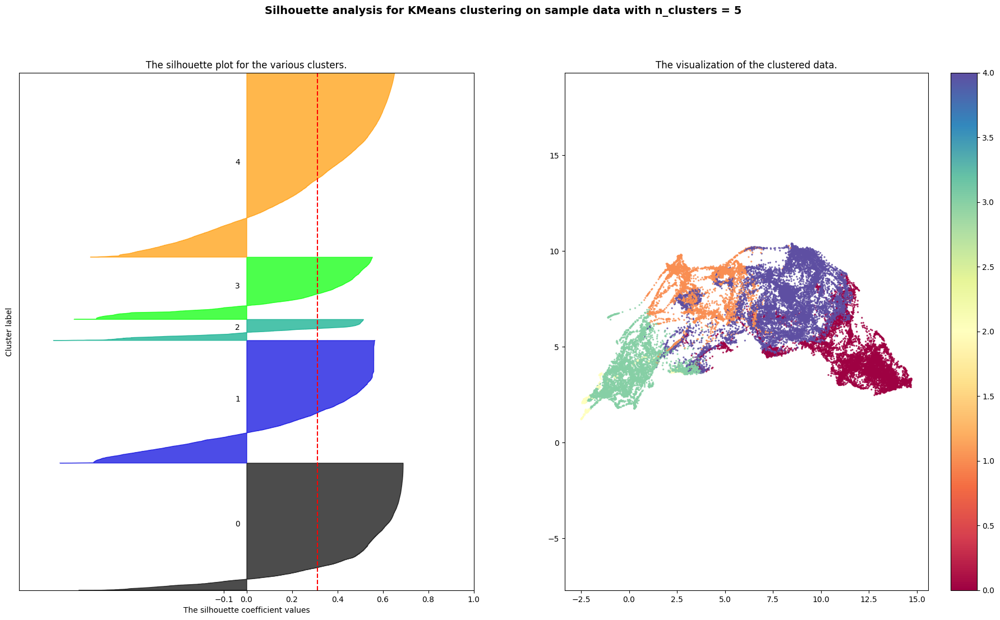

ok path exists
Pose segmentation for VAME model: VAME 

yes
Using CUDA
GPU active: True
GPU used: NVIDIA GeForce RTX 2060
Embedding of latent vector for file video-1


100%|██████████| 100935/100935 [10:38<00:00, 158.01it/s]


For all animals the same parameterization of latent vectors is applied for 6 cluster
Using kmeans as parameterization!
C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0095_0099-TimeWin5s-Mar14-2023\results\video-1\VAME\kmeans-6\
You succesfully extracted motifs with VAME! From here, you can proceed running vame.motif_videos() 
ok path exists
Compute embedding for file video-1
Embedding 30000 data points..
Visualizing 30000 data points.. 


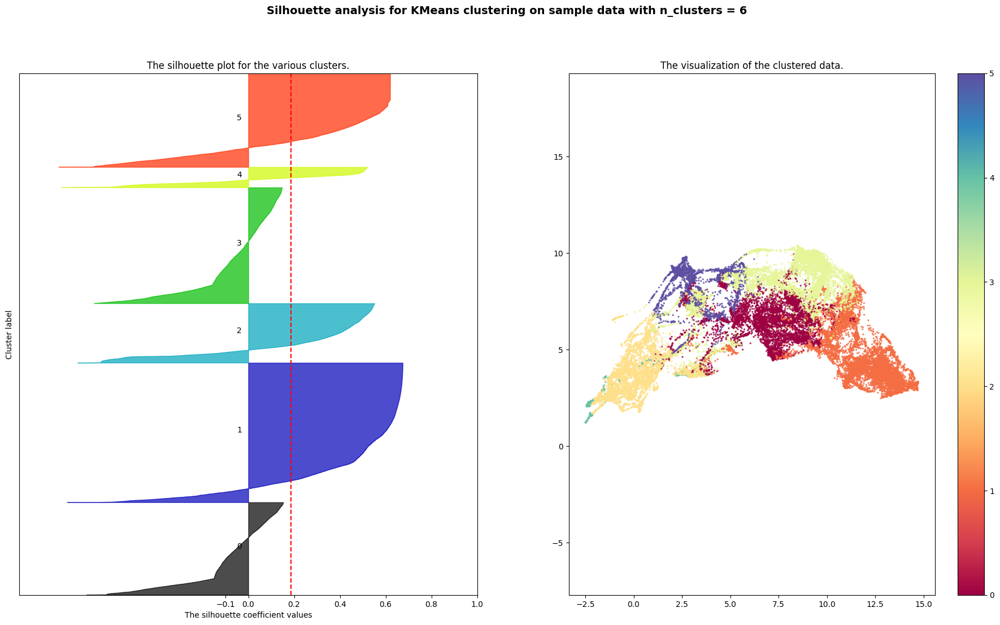

ok path exists
Pose segmentation for VAME model: VAME 

yes
Using CUDA
GPU active: True
GPU used: NVIDIA GeForce RTX 2060
Embedding of latent vector for file video-1


100%|██████████| 100935/100935 [10:35<00:00, 158.85it/s]


For all animals the same parameterization of latent vectors is applied for 7 cluster
Using kmeans as parameterization!
C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0095_0099-TimeWin5s-Mar14-2023\results\video-1\VAME\kmeans-7\
You succesfully extracted motifs with VAME! From here, you can proceed running vame.motif_videos() 
ok path exists
Compute embedding for file video-1
Embedding 30000 data points..
Visualizing 30000 data points.. 


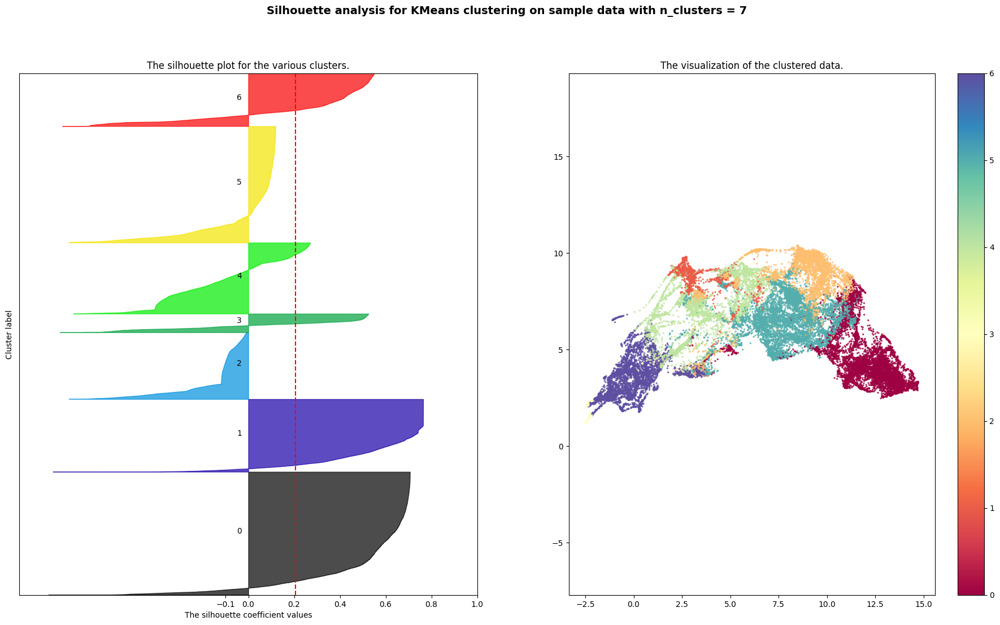

ok path exists
Pose segmentation for VAME model: VAME 

yes
Using CUDA
GPU active: True
GPU used: NVIDIA GeForce RTX 2060
Embedding of latent vector for file video-1


100%|██████████| 100935/100935 [10:42<00:00, 157.16it/s]


For all animals the same parameterization of latent vectors is applied for 8 cluster
Using kmeans as parameterization!
C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0095_0099-TimeWin5s-Mar14-2023\results\video-1\VAME\kmeans-8\
You succesfully extracted motifs with VAME! From here, you can proceed running vame.motif_videos() 
ok path exists
Compute embedding for file video-1
Embedding 30000 data points..
Visualizing 30000 data points.. 


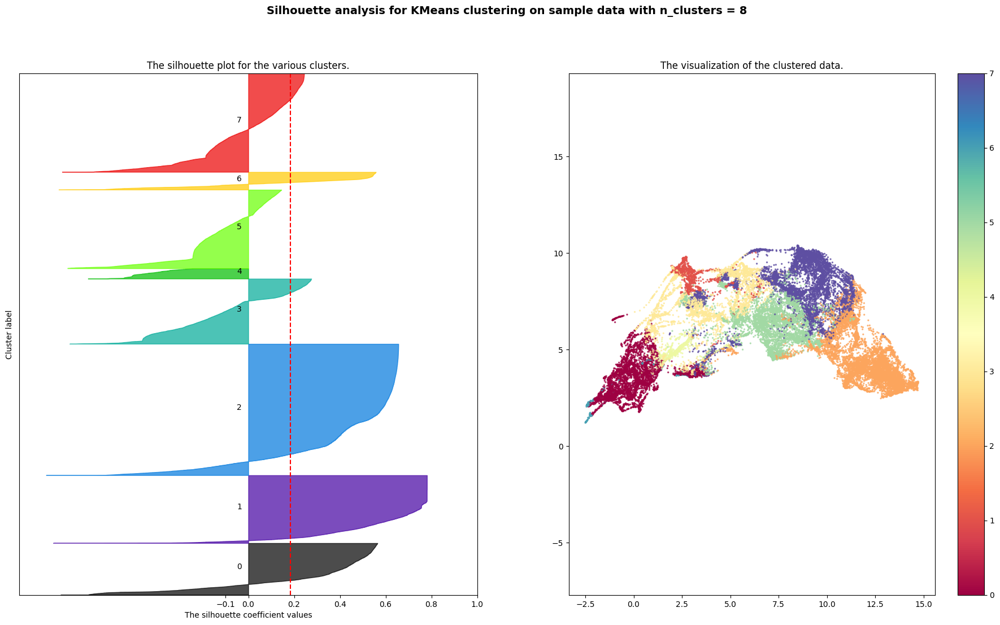

ok path exists
Pose segmentation for VAME model: VAME 

yes
Using CUDA
GPU active: True
GPU used: NVIDIA GeForce RTX 2060
Embedding of latent vector for file video-1


100%|██████████| 100935/100935 [10:43<00:00, 156.82it/s]


For all animals the same parameterization of latent vectors is applied for 10 cluster
Using kmeans as parameterization!
C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0095_0099-TimeWin5s-Mar14-2023\results\video-1\VAME\kmeans-10\
You succesfully extracted motifs with VAME! From here, you can proceed running vame.motif_videos() 
ok path exists
Compute embedding for file video-1
Embedding 30000 data points..
Visualizing 30000 data points.. 


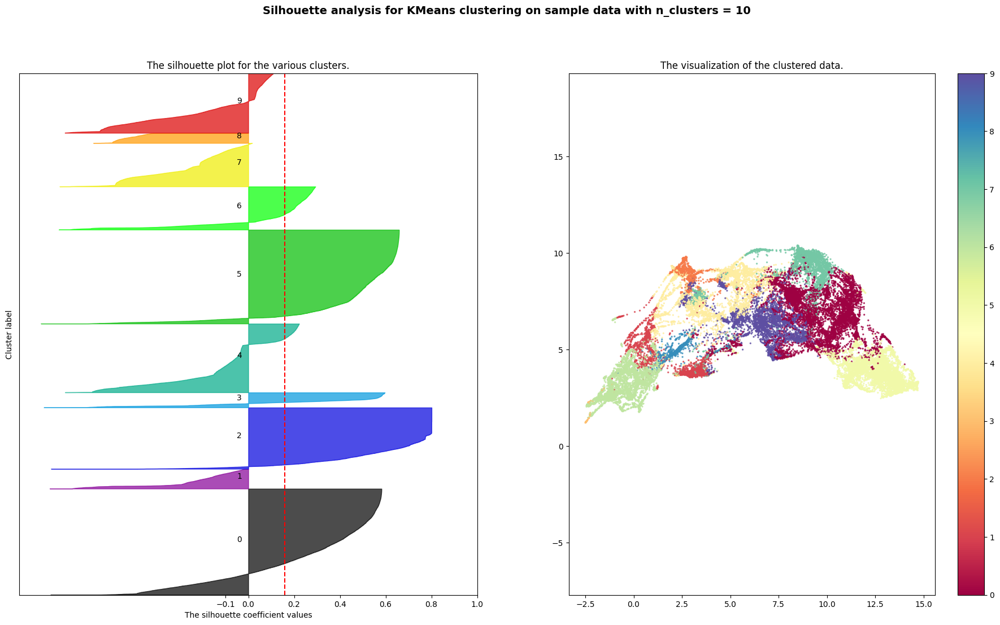

ok path exists
Pose segmentation for VAME model: VAME 

yes
Using CUDA
GPU active: True
GPU used: NVIDIA GeForce RTX 2060
Embedding of latent vector for file video-1


100%|██████████| 100935/100935 [10:46<00:00, 156.20it/s]


For all animals the same parameterization of latent vectors is applied for 15 cluster
Using kmeans as parameterization!
C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0095_0099-TimeWin5s-Mar14-2023\results\video-1\VAME\kmeans-15\
You succesfully extracted motifs with VAME! From here, you can proceed running vame.motif_videos() 
ok path exists
Compute embedding for file video-1
Embedding 30000 data points..
Visualizing 30000 data points.. 


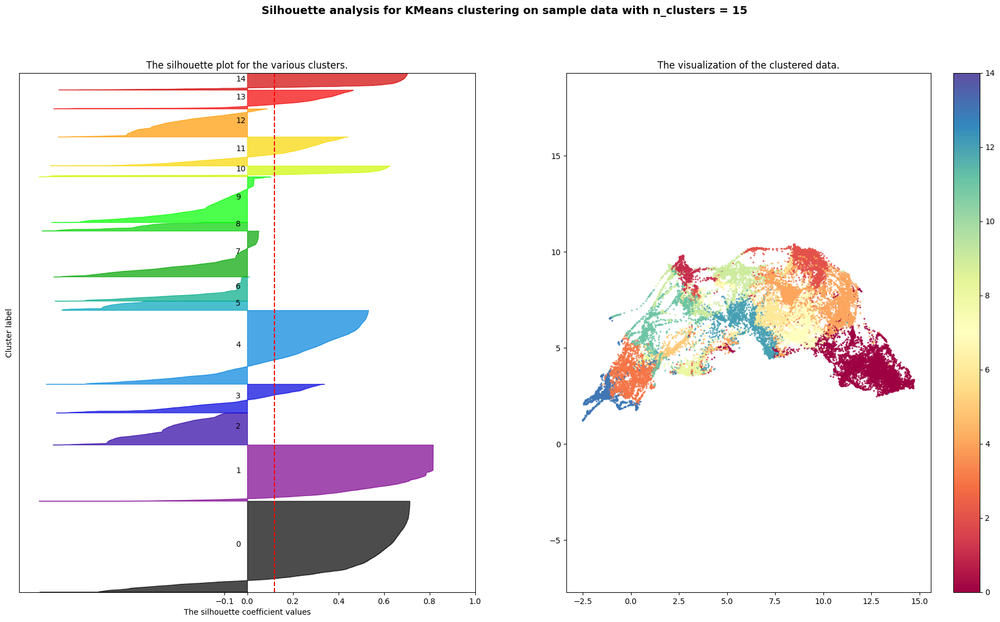

ok path exists
Pose segmentation for VAME model: VAME 

yes
Using CUDA
GPU active: True
GPU used: NVIDIA GeForce RTX 2060
Embedding of latent vector for file video-1


100%|██████████| 100935/100935 [10:46<00:00, 156.08it/s]


For all animals the same parameterization of latent vectors is applied for 25 cluster
Using kmeans as parameterization!
C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0095_0099-TimeWin5s-Mar14-2023\results\video-1\VAME\kmeans-25\
You succesfully extracted motifs with VAME! From here, you can proceed running vame.motif_videos() 
ok path exists
Compute embedding for file video-1
Embedding 30000 data points..
Visualizing 30000 data points.. 


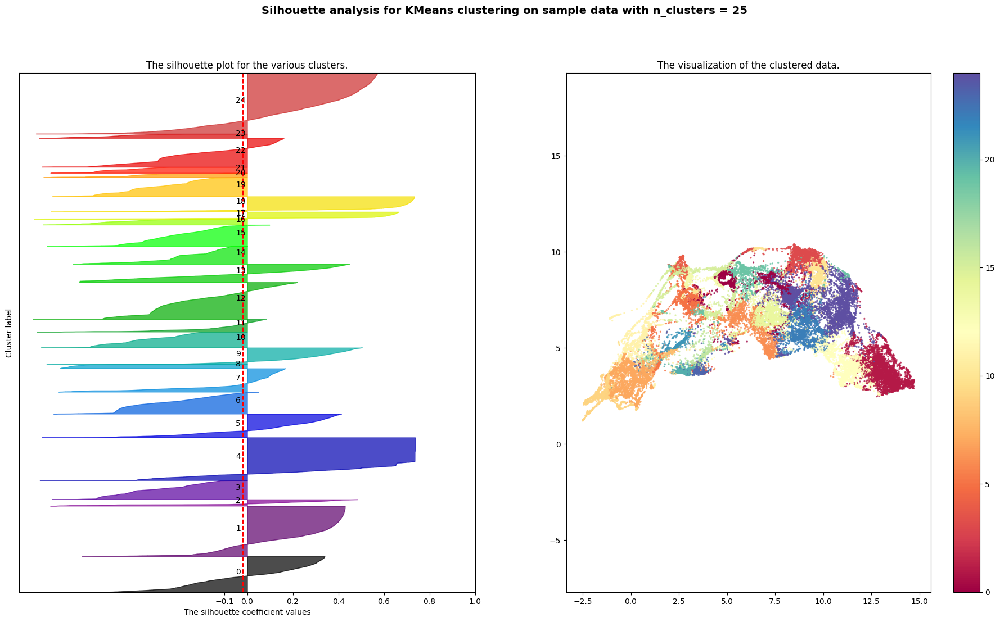

ok path exists
Pose segmentation for VAME model: VAME 

yes
Using CUDA
GPU active: True
GPU used: NVIDIA GeForce RTX 2060
Embedding of latent vector for file video-1


100%|██████████| 100935/100935 [4:06:43<00:00,  6.82it/s]     


For all animals the same parameterization of latent vectors is applied for 35 cluster
Using kmeans as parameterization!
C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0095_0099-TimeWin5s-Mar14-2023\results\video-1\VAME\kmeans-35\
You succesfully extracted motifs with VAME! From here, you can proceed running vame.motif_videos() 
ok path exists
Compute embedding for file video-1
Embedding 30000 data points..
Visualizing 30000 data points.. 


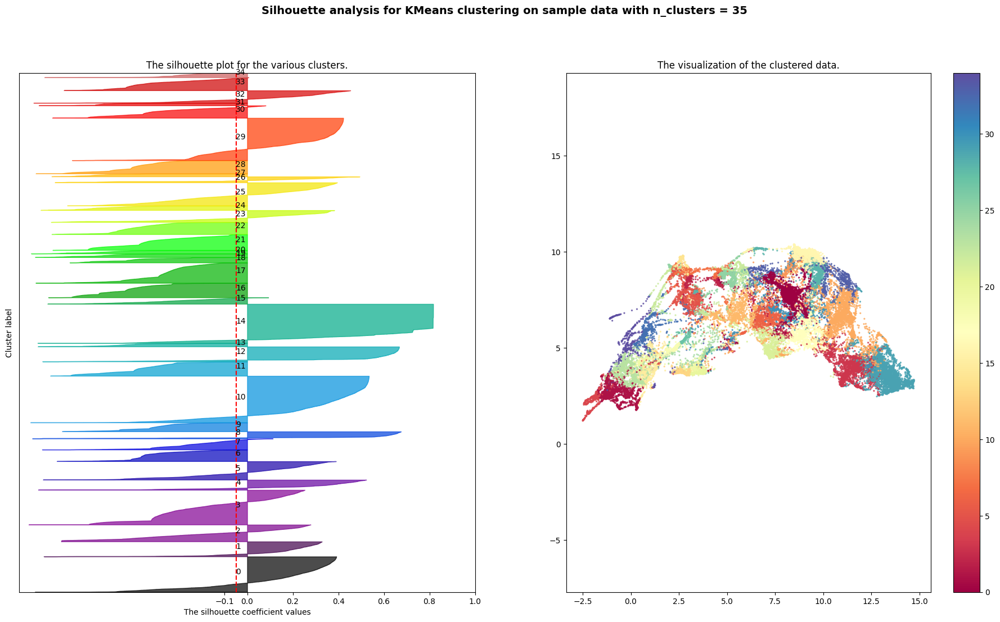

In [18]:
silhouette_avg_by_cluster = silhouette_score_calculus(config)

In [16]:
config_file = Path(config).resolve()
cfg = read_config(config_file)
j = 0
for i in cfg['n_cluster']:
    print(
        "For n_clusters =",
        i,
        "The average silhouette_score is :",
        silhouette_avg_by_cluster[j],
    )
    j+=1

C:\Users\Pierr\OneDrive\Documents\CentraleSupelec\Renault\VAME\VAMETest\VAME-0095_0099-TimeWin3s-Mar12-2023\config.yaml
ok
For n_clusters = 5 The average silhouette_score is : 0.3815553
For n_clusters = 10 The average silhouette_score is : 0.2114836
For n_clusters = 15 The average silhouette_score is : 0.18317042
For n_clusters = 25 The average silhouette_score is : 0.10849487
For n_clusters = 40 The average silhouette_score is : 0.058592584


In [14]:
test = np.load(os.path.join(cfg['project_path'],"results","video-1", 'VAME', "kmeans-20","latent_vector_video-1.npy"))
test.shape

(75350, 30)

In [26]:
def silhouette_score_calculus_latent_space(config):
    list_cluster = [3, 4, 5, 10]
    config_file = Path(config).resolve()
    cfg = read_config(config_file)
    data_ = open_scale_clean_parquet(num_parquet,columns, scaling=False)
    df=np.load(os.path.join(cfg['project_path'],"results","video-1", 'VAME', "kmeans-20","latent_vector_video-1.npy"))
    silhouette_avg_agg = []
    for n_clusters in list_cluster:
        modify_yaml(config, 'n_cluster', n_clusters)
        vame.pose_segmentation(config)

        Path_label=f'VAMETest/VAME-0090_0094-TimeWin10s-Mar19-2023/results/video-1/VAME/kmeans-{n_clusters}/{n_clusters}_km_label_video-1.npy'
        data_label=np.load(Path_label)
        
        silhouette_avg = silhouette_score(df[:len(data_label)], data_label)
        silhouette_avg_agg.append(silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(df[:len(data_label)], data_label)
        
        vame.visualization_for_silhouette(config, 'motif', len(df), n_clusters, sample_silhouette_values, silhouette_avg)
    return silhouette_avg_agg

In [4]:
import cv2
path='VAMETest/VAME-0090_0094-TimeWin10s-Mar19-2023/results/video-1/VAME/kmeans-20'

# Load the main video
main_video = cv2.VideoCapture(os.path.join(path, 'cluster_videos','video-1-motif_20.avi'))

# Load the overlay video
overlay_video = cv2.VideoCapture(os.path.join('OneDrive_1_13-04-2023','full_len_roulage_v2.mp4'))

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
output = cv2.VideoWriter('final_video_roulage.avi', fourcc, 25, (1200, 800))

# Loop through the frames of the main video
while main_video.isOpened():
    # Read a frame from the main video
    ret, main_frame = main_video.read()
    if not ret:
        break

    # Read a frame from the overlay video
    ret, overlay_frame = overlay_video.read() 

    # Resize the overlay video frame to fit on the main video
    overlay_frame = cv2.resize(overlay_frame, (300, 200))

    # Define the region of interest (ROI) where the overlay video will be placed
    roi = main_frame[590:790, 10:310]

    # Add the overlay video frame to the ROI
    result = cv2.addWeighted(roi, 0.5, overlay_frame, 0.4, -10)

    # Replace the ROI in the main frame with the result
    main_frame[590:790, 10:310] = result

    # Write the resulting frame to the output video
    output.write(main_frame)


# Release the resources
main_video.release()
overlay_video.release()
output.release()

In [19]:
video = cv2.VideoCapture())
path='VAMETest/VAME-0090_0094-TimeWin10s-Mar19-2023/results/video-1/VAME/kmeans-20'

# Create a directory to save the PNG files
output_dir = os.path.join(path, 'frame_roulage')
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Get the total number of frames in the video
total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))

# Start capturing frames
for i in range(total_frames):
    # Set the frame index
    frame_index = i

    # Set the video frame index
    video.set(cv2.CAP_PROP_POS_FRAMES, frame_index)

    # Read the frame
    ret, frame = video.read()

    # Save the frame as a PNG file
    output_file = os.path.join(output_dir, f"frame_{i}.png")
    cv2.imwrite(output_file, frame)

# Release the video object
video.release()

In [7]:
import cv2

# Open the video file
video = cv2.VideoCapture(os.path.join('OneDrive_1_13-04-2023','full_len_roulage_v2.mp4'))
print(video.isOpened())
# Get the fps of the original video
fps = video.get(cv2.CAP_PROP_FPS)

# Create a VideoWriter object to save the new video
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('new_video.mp4', fourcc, fps, (640, 480))

# Loop through each frame of the original video
while True:
    ret, frame = video.read()
    if not ret:
        break
    
    # Write the frame to the new video with the same fps
    out.write(frame)

# Release the video objects
video.release()
out.release()

True


KeyboardInterrupt: 